# CV Assignment 5

### Roll no. 20171002

### Requirements :-
##### Libraries:-
* Numpy
* os
* Python 3.x
* scikit-image
* matplotlib
* math
* OpenCV 3.4.2.16

### To run this notebook successfully, please ensure the following steps.
* Ensure that all the libraries mentioned above are installed
* Ensure that in the current working directory the input folders as mentioned in the assignment pdf and its entire folder structure exists and is maintained. **This is the input data to notebook.**



### Note:-
* ***If any of the steps are missing/files are missing, then some parts of the code may or may not work***
* *The Results folder contains some outputs saved from the script*
* It is advised to use the testing machine in "plugged in" mode, to avoid core suppression as happens in most modern PCs.

In [1]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy.signal import convolve2d as conv2
from PIL import Image
import random
import skimage.morphology
from skimage.io import imread_collection

In [2]:
def imgradient(im):
    kernel = np.array([[-1, 1],[-1, 1]])
    return conv2(im,kernel,boundary='symm',mode='same'),conv2(im,kernel.T,boundary='symm',mode='same')

In [3]:
def imsmooth2d(im,sz = 2):
    kernel = np.ones((sz,sz))/(sz**2)
    return conv2(im,kernel,boundary='symm',mode='same')

In [4]:
def readframes(path1,path2):
    return Image.open(path1).convert('L'),Image.open(path2).convert('L')

## Lucas Kanade Optical Flow

In [5]:
def lucaskanade_optflow(frame1, frame2, window_sz = 3, num_features = 10000, t=1, mode = 'seg'):
    frame1 = np.array(frame1)
    frame2 = np.array(frame2)
    feature_map = np.zeros(frame1.shape)
    if(mode == 'full'):
        frame1 = np.array(frame1)/255
        frame2 = np.array(frame2)/255
        Ix,Iy = imgradient(frame1)
        It = frame1 - frame2
        sz = window_sz
        Ix2 = imsmooth2d(Ix**2,sz)
        Iy2 = imsmooth2d(Iy**2,sz)
        Ixy = imsmooth2d(Ix*Iy,sz)
        Ixt = imsmooth2d(Ix*It,sz)
        Iyt = imsmooth2d(Iy*It,sz)
        h,w = frame1.shape
        u = np.zeros((h,w))
        v = np.zeros((h,w))
        for i in range(h):
            for j in range(w):
                At_A = np.array([[Ix2[i,j],Ixy[i,j]],[Ixy[i,j],Iy2[i,j]]])
                flow_vec = np.linalg.pinv(At_A).dot(np.array([-Ixt[i,j],-Iyt[i,j]]))
                if(np.linalg.norm(flow_vec) > t):
                    u[i,j],v[i,j] = flow_vec
        seg_map = np.zeros(frame1.shape)
        fig = plt.figure(figsize=(10,10))
        plt.title('Vector field for Dense Optical flow')
        plt.imshow(frame1,'gray')
        for i in range(0, h, 20):
            for j in range(0, w, 20):
                if(u[i,j]!=0 or v[i,j]!=0):
                    plt.arrow(j,i,v[i,j],u[i,j],head_width = 5, head_length = 5, color = "y")
                    seg_map[i,j] = 1
        plt.axis('off')

        
    else:
        Ix,Iy = imgradient(frame1)
        It = imsmooth2d(frame2) - imsmooth2d(frame1)
        u = np.zeros(frame1.shape)
        v = np.zeros(frame1.shape)
        feature_map = np.zeros(frame1.shape)
        features = cv2.goodFeaturesToTrack(frame1, 10000 ,0.01 ,10).reshape(-1,2)
        
        for f in range(features.shape[0]):
            j,i = features[f,0] , features[f,1]
            i = np.int(i)
            j = np.int(j)
            feature_map[i,j]=1
        for i in range(3,frame1.shape[0]-3):
            for j in range(3,frame1.shape[1]-3):
                Wx = np.array([Ix[i-1,j-1],Ix[i,j-1],Ix[i+1,j-1],Ix[i-1,j],Ix[i,j],Ix[i+1,j],Ix[i-1,j+1],Ix[i,j+1],Ix[i+1,j+1]])
                Wy = np.array([Iy[i-1,j-1],Iy[i,j-1],Iy[i+1,j-1],Iy[i-1,j],Iy[i,j],Iy[i+1,j],Iy[i-1,j+1],Iy[i,j+1],Iy[i+1,j+1]])
                Wt = np.array([It[i-1,j-1],It[i,j-1],It[i+1,j-1],It[i-1,j],It[i,j],It[i+1,j],It[i-1,j+1],It[i,j+1],It[i+1,j+1]])

                A = np.vstack((Wx,Wy)).T
                b = np.dot(A.T,Wt)
                A = np.dot(A.T,A)
                A_inv = np.linalg.pinv(A)
                (u[i,j],v[i,j]) = np.dot(A_inv,b)
                
        fig, ax = plt.subplots(figsize = (12, 12))
        ax.set_title("Vector Field")
        ax.imshow(frame1, cmap = "gray")
        for i in range(frame1.shape[0]):
            for j in range(frame1.shape[1]):
                if feature_map[i,j] == 1:
                    if abs(u[i,j])>t or abs(v[i,j])>t:
                        plt.arrow(j,i,v[i,j],u[i,j],head_width = 5, head_length = 5, color = "y")
        plt.axis('off')
        plt.show()
    return u,v,feature_map

In [7]:
frame1,frame2 = readframes('./eval-data-gray/Dumptruck/frame10.png','./eval-data-gray/Dumptruck/frame11.png')

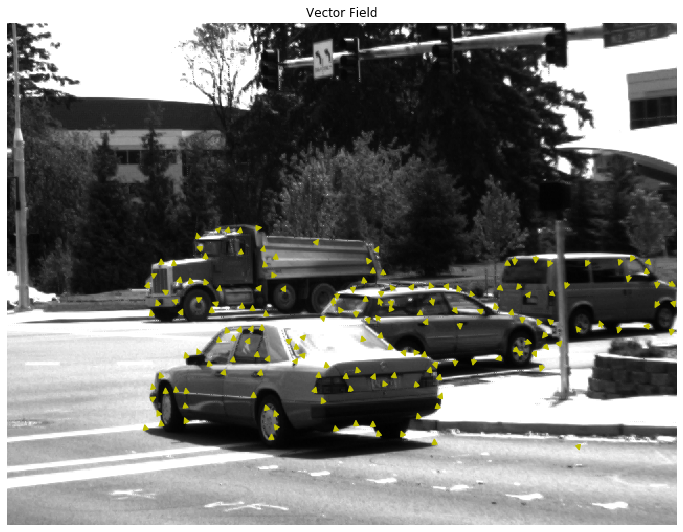

In [8]:
u,v,feature_map = lucaskanade_optflow(frame1,frame2,20,t=0.2,mode = 'seg')

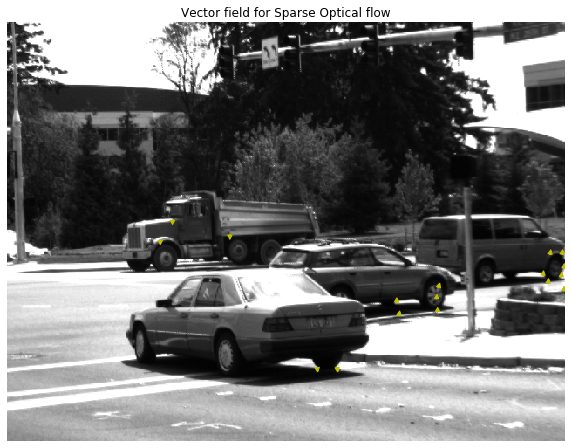

In [10]:
frame1,frame2 = readframes('./eval-data-gray/Dumptruck/frame10.png','./eval-data-gray/Dumptruck/frame11.png')
u,v = lucaskanade_optflow(frame1,frame2,50,t=0.5)

## Object Segmentation and Detection

In [19]:
def findObjects(u,v,feature_map,frame1,idx,t=0.2,thresh=0.8):
    frame1 = np.array(frame1)
    seg_mask=((u*u + v*v)>thresh)
    morph_disk = skimage.morphology.disk(5)
    seg_mask = skimage.morphology.convex_hull_object(seg_mask)
    seg_mask = skimage.morphology.binary_opening(seg_mask, morph_disk)
    seg_mask = skimage.morphology.remove_small_objects(seg_mask, 5000)
    fig,ax3 = plt.subplots(figsize=(12,12))
    ax3.set_title("Optical Flow with detection:")
    obj_mask = skimage.measure.label(seg_mask)
    ax3.imshow(frame1,cmap='gray')
    for i in range(frame1.shape[0]):
        for j in range(frame1.shape[1]):
            if feature_map[i,j] == 1:
                if abs(u[i,j])>t or abs(v[i,j])>t:
                    ax3.arrow(j,i,v[i,j],u[i,j],head_width = 5, head_length = 5, color = "y")
    for region in skimage.measure.regionprops(obj_mask):
        y, x, y2, x2 = region.bbox
        if(np.sum(feature_map[y:y2,x:x2])!=0) :
            height = y2 - y
            width = x2 - x
            ax3.add_patch(patches.Rectangle((x,y),width,height,linewidth=2,edgecolor='g',facecolor='none'))
    plt.axis('off')
    plt.savefig('./LUCASKANADE/output_'+str(idx)+'.jpg')


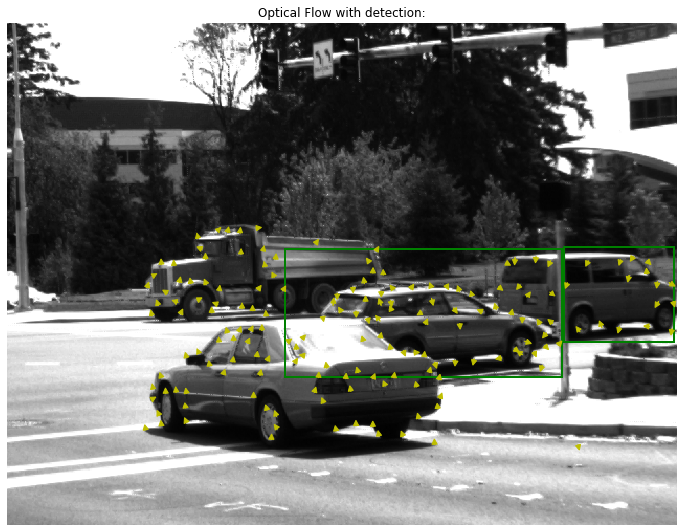

In [10]:
findObjects(u,v,feature_map,frame1,idx = 1,thresh=0.5)

## Multi Object Tracking

In [24]:
def vid2frames(video_path,save_path = ''):
    # Create video capture object
    cap = cv2.VideoCapture(video_path)
    
    # Create folder to save video
    if(save_path == ''):
        outFolder = './' + video_path.split('.')[0] + '_frames'
    else:
        outFolder = save_path
    if (os.path.exists(outFolder)!= 1):
        os.mkdir(outFolder)
    
    cnt = 0
    while(cap.isOpened()):
        ret, frame = cap.read()
        if(ret):
            cv2.imwrite(outFolder + '/frame%d.jpg' %cnt,frame)
            cnt+=1
        else:
            break
 
    cap.release() 
    
def frames2vid(video_name,images_folder,fps = 30):
    # Create video writer object
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    # Make sure video_name is a string with .avi in the end
    out = cv2.VideoWriter(video_name,fourcc,fps,(1920,1080),True)
    
    frames = imread_collection(images_folder + '/*.jpg')
    for i in frames:
        im = cv2.cvtColor(np.array(i), cv2.COLOR_RGB2BGR)
        out.write(im)
    
    out.release()

In [1]:
!wget https://github.com/opencv/opencv/raw/master/samples/data/vtest.avi

--2020-04-19 16:35:43--  https://github.com/opencv/opencv/raw/master/samples/data/vtest.avi
Resolving github.com (github.com)... 13.234.210.38
Connecting to github.com (github.com)|13.234.210.38|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/opencv/opencv/master/samples/data/vtest.avi [following]
--2020-04-19 16:35:44--  https://raw.githubusercontent.com/opencv/opencv/master/samples/data/vtest.avi
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.152.133
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.152.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8131690 (7.8M) [application/octet-stream]
Saving to: 'vtest.avi.1'

     0K .......... .......... .......... .......... ..........  0%  570K 14s
    50K .......... .......... .......... .......... ..........  1%  494K 15s
   100K .......... .......... .......... .......... ..........  1% 1.4

In [12]:
vid2frames('./vtest.avi')

In [21]:
def gen_bboxes_vid(frame_folder, cnts = 20):
    frames = imread_collection(frame_folder + '/*.jpg')
    for i in range(1,min(len(frames),cnts)):
        frame1 = cv2.cvtColor(frames[i], cv2.COLOR_RGB2GRAY)
        frame2 = cv2.cvtColor(frames[i-1], cv2.COLOR_RGB2GRAY)
        u,v,feature_map = lucaskanade_optflow(frame1,frame2,20,t=0.2,mode = 'seg')
        findObjects(u,v,feature_map,frame1,idx = i,thresh=0.5)

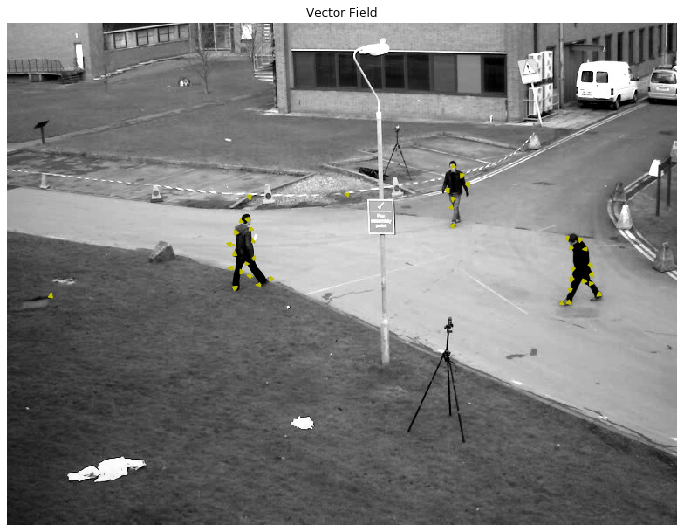

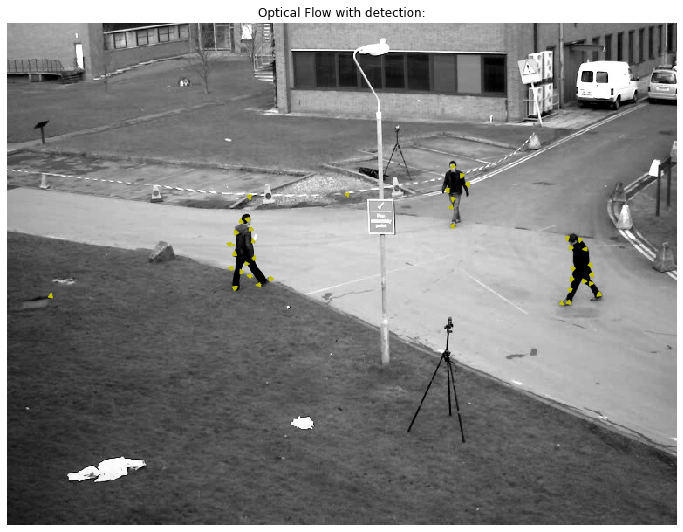

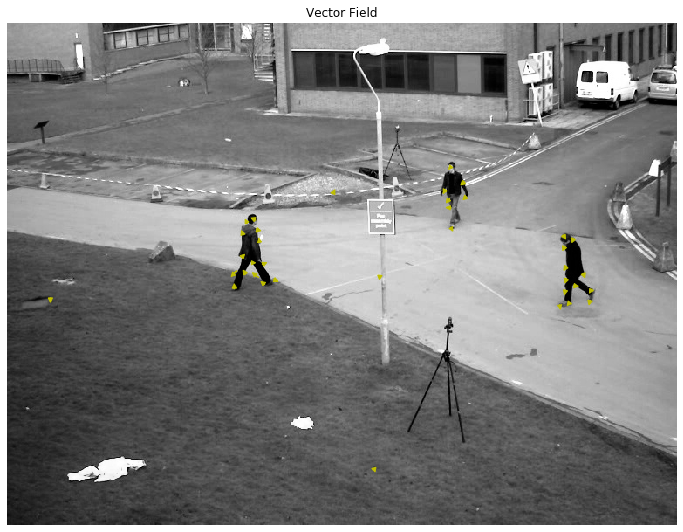

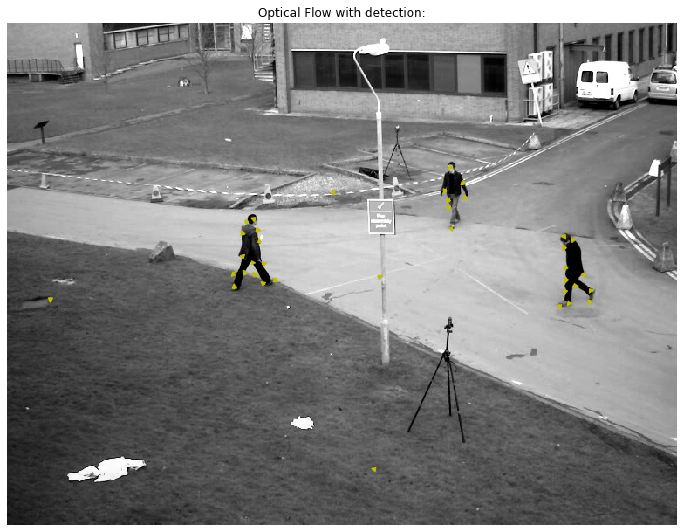

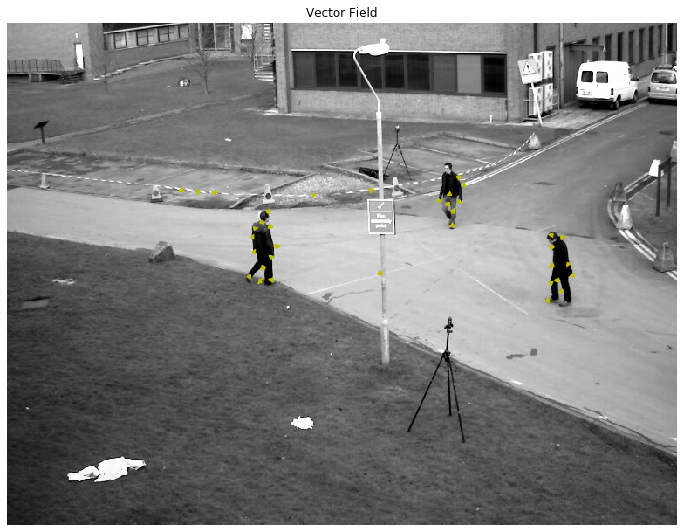

...

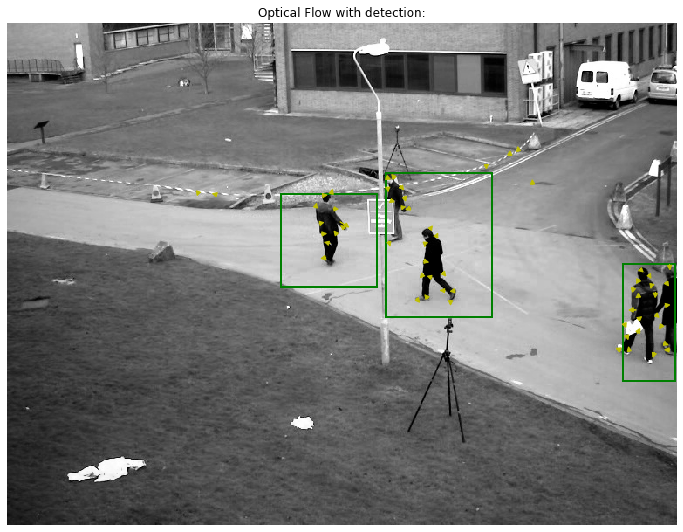

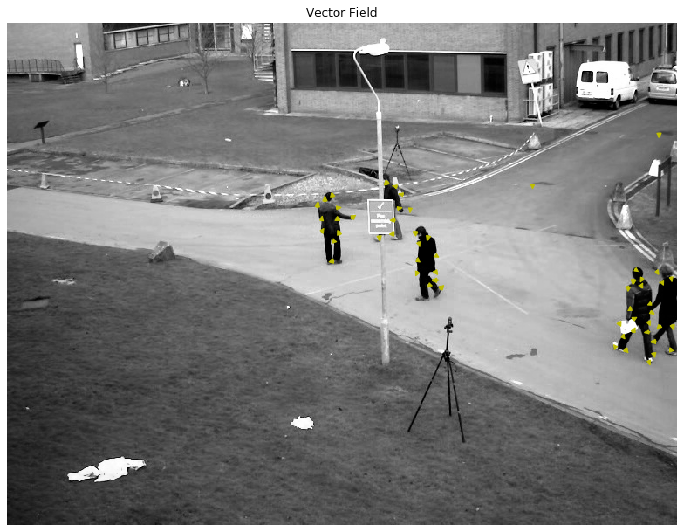

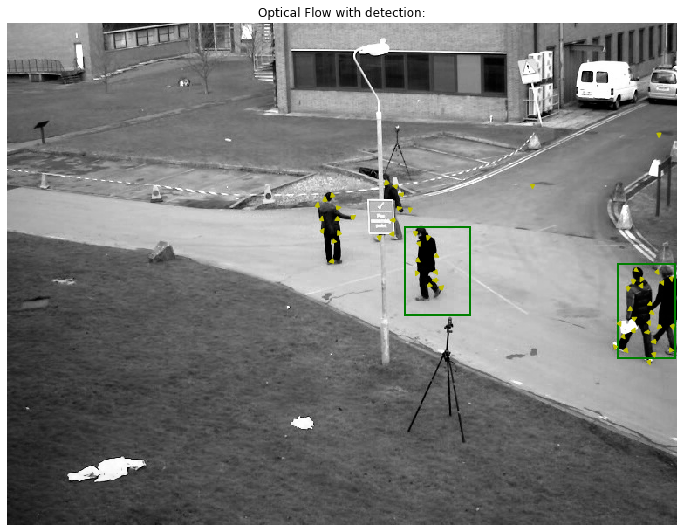

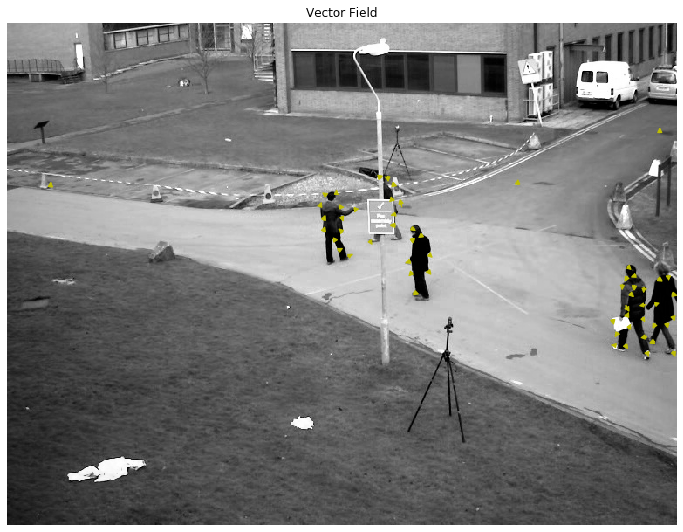

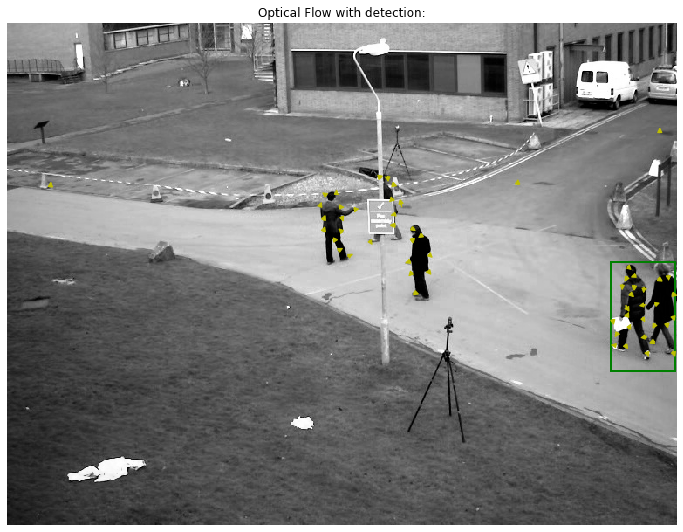

In [22]:
gen_bboxes_vid('./frames')

In [25]:
frames2vid('video_tracking.avi','./LUCASKANADE',fps = 60)